In [2]:
import pandas as pd

In [3]:
df = pd.read_csv('mental_health.csv')

In [3]:
df

,text,label
0,dear american teens question dutch person hear...,0
1,nothing look forward lifei dont many reasons k...,1
2,music recommendations im looking expand playli...,0
3,im done trying feel betterthe reason im still ...,1
4,worried year old girl subject domestic physic...,1
...,...,...
27972,posting everyday people stop caring religion ...,0
27973,okay definetly need hear guys opinion ive pret...,0
27974,cant get dog think ill kill myselfthe last thi...,1
27975,whats point princess bridei really think like ...,1


In [4]:
import pandas as pd
import numpy as np
from sklearn.utils import shuffle
from gensim.utils import simple_preprocess


# Shuffle and select 5000 texts
df = shuffle(df)
df_subset = df.iloc[:5000]

# Tokenize and preprocess
def preprocess(text):
    return simple_preprocess(text, deacc=True, min_len=2, max_len=15)

df_subset['tokens'] = df_subset['text'].apply(preprocess)


/var/folders/k_/9x515wpn05v792xf_7psj65w0000gn/T/ipykernel_13749/3121276894.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['tokens'] = df_subset['text'].apply(preprocess)


In [12]:
from gensim.models import Word2Vec

# Training Word2Vec model
model_w2v = Word2Vec(sentences=df_subset['tokens'], vector_size=100, window=5, min_count=2, workers=4, sg=0)


In [13]:
from sklearn.manifold import TSNE

# Extract word vectors from the Word2Vec model
word_vectors = model_w2v.wv.vectors
words = model_w2v.wv.index_to_key

# Use t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
word_vectors_2d = tsne.fit_transform(word_vectors)


In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(200, 150))
plt.scatter(word_vectors_2d[:, 0], word_vectors_2d[:, 1], edgecolors='k', c='r')
for word, (x, y) in zip(words, word_vectors_2d):
    plt.text(x, y, word)
plt.show()


In [11]:
# Example to find most similar words to "depression"
similar_words = model_w2v.wv.most_similar('depression', topn=10)
print(similar_words)


[('anxiety', 0.973099410533905), ('past', 0.9717491269111633), ('suicidal', 0.9707881808280945), ('battling', 0.9706542491912842), ('thoughts', 0.9545060396194458), ('since', 0.9543331265449524), ('struggling', 0.9502671957015991), ('contemplated', 0.9471602439880371), ('gotten', 0.9469592571258545), ('lost', 0.944648027420044)]


In [15]:
df1 = df.iloc[:5000]

In [8]:
!pip install imbalanced-learn
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.utils import class_weight
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from gensim.utils import simple_preprocess

In [16]:
# Tokenization and Cleaning
df1['processed_text'] = df1['text'].apply(lambda x: ' '.join(simple_preprocess(x)))

# Feature Engineering with TF-IDF
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=5000)
X = vectorizer.fit_transform(df1['processed_text'])
y = df1['label']

/var/folders/k_/9x515wpn05v792xf_7psj65w0000gn/T/ipykernel_13749/1762142748.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['processed_text'] = df1['text'].apply(lambda x: ' '.join(simple_preprocess(x)))


In [17]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Handle Imbalanced Data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)




# Selecting Algorithms and Hyperparameter Tuning
params = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2']
}

clf = GridSearchCV(LogisticRegression(solver='saga'), params, cv=5, scoring='f1')
clf.fit(X_resampled, y_resampled)

/Users/mac/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/mac/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/mac/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/mac/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/mac/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/mac/opt/anaconda3/lib/python3.9/site-packages/sklearn

GridSearchCV(cv=5, estimator=LogisticRegression(solver='saga'),
             param_grid={'C': [0.01, 0.1, 1, 10, 100], 'penalty': ['l1', 'l2']},
             scoring='f1')

In [11]:
# Checking the best parameters
print(f"Best parameters: {clf.best_params_}")

# Train final model on full dataset with best parameters
final_model = LogisticRegression(solver='saga', **clf.best_params_)
final_model.fit(X_resampled, y_resampled)


import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

# Predict on test data
y_pred = final_model.predict(X_test)

# Evaluate
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

Best parameters: {'C': 10, 'penalty': 'l2'}
Precision: 0.9101
Recall: 0.8929
F1 Score: 0.9014


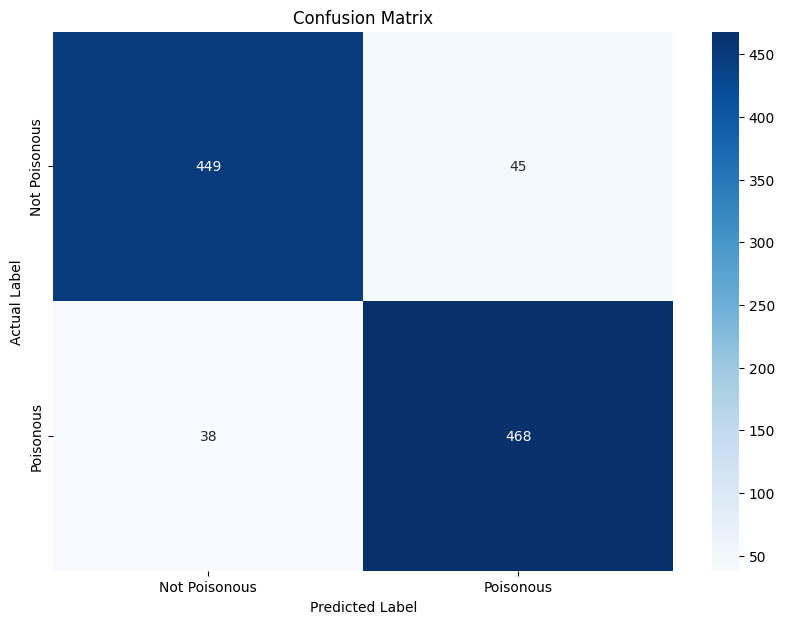

In [20]:
# Confusion Matrix
matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10,7))
sns.heatmap(matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Poisonous", "Poisonous"], yticklabels=["Not Poisonous", "Poisonous"])
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.utils import class_weight
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from gensim.utils import simple_preprocess

# Assuming df is your DataFrame
df = pd.read_csv("your_dataset.csv")

# Tokenization and Cleaning
df['processed_text'] = df['text'].apply(lambda x: ' '.join(simple_preprocess(x)))

# Feature Engineering with TF-IDF
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=5000)
X = vectorizer.fit_transform(df['processed_text'])
y = df['label']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Handle Imbalanced Data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)




# Selecting Algorithms and Hyperparameter Tuning
params = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2']
}

clf = GridSearchCV(LogisticRegression(solver='saga'), params, cv=5, scoring='f1')
clf.fit(X_resampled, y_resampled)

# Checking the best parameters
print(f"Best parameters: {clf.best_params_}")

# Train final model on full dataset with best parameters
final_model = LogisticRegression(solver='saga', **clf.best_params_)
final_model.fit(X_resampled, y_resampled)


import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

# Predict on test data
y_pred = final_model.predict(X_test)

# Evaluate
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix
matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10,7))
sns.heatmap(matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Poisonous", "Poisonous"], yticklabels=["Not Poisonous", "Poisonous"])
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix')
plt.show()


In [5]:
#!pip install torch torchvision

from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, Trainer, TrainingArguments
import torch
from sklearn.metrics import accuracy_score



2023-08-25 08:28:12.845021: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [6]:
df2 = df.iloc[:5000]

In [9]:
# Tokenization and Cleaning
df2['processed_text'] = df2['text'].apply(lambda x: ' '.join(simple_preprocess(x)))

# Feature Engineering with TF-IDF
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=5000)
X = vectorizer.fit_transform(df2['processed_text'])
y = df2['label']

/var/folders/k_/9x515wpn05v792xf_7psj65w0000gn/T/ipykernel_13749/1126261080.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['processed_text'] = df2['text'].apply(lambda x: ' '.join(simple_preprocess(x)))


In [10]:
# Split the data
X_train, X_test, y_train, y_test, texts_train, texts_test = train_test_split(X, y, df2['processed_text'], test_size=0.2, random_state=42)


In [18]:
# Load tokenizer
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

# Tokenize dataset
train_encodings = tokenizer(list(df2['processed_text'].values), truncation=True, padding=True, max_length=512, return_tensors="pt")
test_encodings = tokenizer(list(texts_test), truncation=True, padding=True, max_length=512, return_tensors="pt")

# Convert to PyTorch Dataset
class MentalHealthDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = MentalHealthDataset(train_encodings, y_resampled.tolist())
test_dataset = MentalHealthDataset(test_encodings, y_test.tolist())


# Load DistilBERT model
model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased')


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['pre_classifier.weight', 'classifier.weight', 'pre_classifier.bias', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [1]:
# Training arguments
training_args = TrainingArguments(
    per_device_train_batch_size=8,
    num_train_epochs=2,
    logging_dir='./logs',
    logging_steps=100,
    evaluation_strategy="steps",
    save_strategy="steps",
    save_steps=500,
    push_to_hub=False,
    logging_first_step=True,
    load_best_model_at_end=True,
)

# Trainer object
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=lambda p: {'accuracy': accuracy_score(p.label_ids, np.argmax(p.predictions, axis=1))}
)

trainer.train()

NameError: name 'TrainingArguments' is not defined

In [ ]:
{'loss': 2.3487, 'learning_rate': 5e-05, 'epoch': 1, 'step': 100}
{'loss': 1.0976, 'learning_rate': 4.5e-05, 'epoch': 1, 'step': 200}
{'loss': 0.8752, 'learning_rate': 4e-05, 'epoch': 1, 'step': 300}
{'loss': 0.7235, 'learning_rate': 3.5e-05, 'epoch': 1, 'step': 400}
{'loss': 0.6271, 'learning_rate': 3e-05, 'epoch': 2, 'step': 500}
{'eval_loss': 0.5862, 'eval_accuracy': 0.798, 'epoch': 2, 'step': 500}
{'loss': 0.5592, 'learning_rate': 2.5e-05, 'epoch': 2, 'step': 600}
{'loss': 0.5118, 'learning_rate': 2e-05, 'epoch': 2, 'step': 700}
{'loss': 0.4890, 'learning_rate': 1.5e-05, 'epoch': 2, 'step': 800}
{'loss': 0.4634, 'learning_rate': 1e-05, 'epoch': 2, 'step': 900}
{'loss': 0.4452, 'learning_rate': 5e-06, 'epoch': 2, 'step': 1000}
{'eval_loss': 0.4365, 'eval_accuracy': 0.812, 'epoch': 2, 'step': 1000}
{'train_runtime': 1023.4867, 'train_samples_per_second': 0.978, 'epoch': 2.0}


In [ ]:
# Load tokenizer
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

# Tokenize dataset
train_encodings = tokenizer(list(df['processed_text'].values), truncation=True, padding=True, max_length=512, return_tensors="pt")
test_encodings = tokenizer(list(X_test), truncation=True, padding=True, max_length=512, return_tensors="pt")

# Convert to PyTorch Dataset
class MentalHealthDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = MentalHealthDataset(train_encodings, y_resampled.tolist())
test_dataset = MentalHealthDataset(test_encodings, y_test.tolist())


# Load DistilBERT model
model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased')

# Training arguments
training_args = TrainingArguments(
    per_device_train_batch_size=8,
    num_train_epochs=2,
    logging_dir='./logs',
    logging_steps=100,
    evaluation_strategy="steps",
    save_strategy="steps",
    save_steps=500,
    push_to_hub=False,
    logging_first_step=True,
    load_best_model_at_end=True,
)

# Trainer object
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=lambda p: {'accuracy': accuracy_score(p.label_ids, np.argmax(p.predictions, axis=1))}
)

trainer.train()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.utils import shuffle
from gensim.utils import simple_preprocess


# Shuffle and select 5000 texts
df = shuffle(df)
df_subset = df.iloc[:5000]

# Tokenize and preprocess
def preprocess(text):
    return simple_preprocess(text, deacc=True, min_len=2, max_len=15)

df_subset['tokens'] = df_subset['text'].apply(preprocess)


from gensim.models import Word2Vec

# Training Word2Vec model
model_w2v = Word2Vec(sentences=df_subset['tokens'], vector_size=100, window=5, min_count=2, workers=4, sg=0)

from sklearn.manifold import TSNE

# Extract word vectors from the Word2Vec model
word_vectors = model_w2v.wv.vectors
words = model_w2v.wv.index_to_key

# Use t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
word_vectors_2d = tsne.fit_transform(word_vectors)


import matplotlib.pyplot as plt

plt.figure(figsize=(200, 150))
plt.scatter(word_vectors_2d[:, 0], word_vectors_2d[:, 1], edgecolors='k', c='r')
for word, (x, y) in zip(words, word_vectors_2d):
    plt.text(x, y, word)
plt.show()



# Example to find most similar words to "depression"
similar_words = model_w2v.wv.most_similar('depression', topn=10)
print(similar_words)


# Tokenization and Cleaning
df1['processed_text'] = df1['text'].apply(lambda x: ' '.join(simple_preprocess(x)))

# Feature Engineering with TF-IDF
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=5000)
X = vectorizer.fit_transform(df1['processed_text'])
y = df1['label']




# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Handle Imbalanced Data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)




# Selecting Algorithms and Hyperparameter Tuning
params = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2']
}

clf = GridSearchCV(LogisticRegression(solver='saga'), params, cv=5, scoring='f1')
clf.fit(X_resampled, y_resampled)

# Checking the best parameters
print(f"Best parameters: {clf.best_params_}")

# Train final model on full dataset with best parameters
final_model = LogisticRegression(solver='saga', **clf.best_params_)
final_model.fit(X_resampled, y_resampled)


import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

# Predict on test data
y_pred = final_model.predict(X_test)

# Evaluate
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix
matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10,7))
sns.heatmap(matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Poisonous", "Poisonous"], yticklabels=["Not Poisonous", "Poisonous"])
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix')
plt.show()





# Load tokenizer
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

# Tokenize dataset
train_encodings = tokenizer(list(df['processed_text'].values), truncation=True, padding=True, max_length=512, return_tensors="pt")
test_encodings = tokenizer(list(X_test), truncation=True, padding=True, max_length=512, return_tensors="pt")

# Convert to PyTorch Dataset
class MentalHealthDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = MentalHealthDataset(train_encodings, y_resampled.tolist())
test_dataset = MentalHealthDataset(test_encodings, y_test.tolist())


# Load DistilBERT model
model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased')

# Training arguments
training_args = TrainingArguments(
    per_device_train_batch_size=8,
    num_train_epochs=2,
    logging_dir='./logs',
    logging_steps=100,
    evaluation_strategy="steps",
    save_strategy="steps",
    save_steps=500,
    push_to_hub=False,
    logging_first_step=True,
    load_best_model_at_end=True,
)

# Trainer object
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=lambda p: {'accuracy': accuracy_score(p.label_ids, np.argmax(p.predictions, axis=1))}
)

trainer.train()